In [1]:
%pip install matplotlib


Note: you may need to restart the kernel to use updated packages.


In [2]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt

print("TensorFlow version:", tf.__version__)
print("Keras version:", tf.keras.__version__)

TensorFlow version: 2.17.0
Keras version: 3.5.0


In [3]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3 # RGB
EPOCHS = 5   # trial and error

In [4]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "PotatoVillage",
    shuffle = True,
    image_size = (IMAGE_SIZE , IMAGE_SIZE),
    batch_size = BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


In [5]:
class_names = dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [6]:
len(dataset)  # 32*68=2176 (approx. 2152)

68

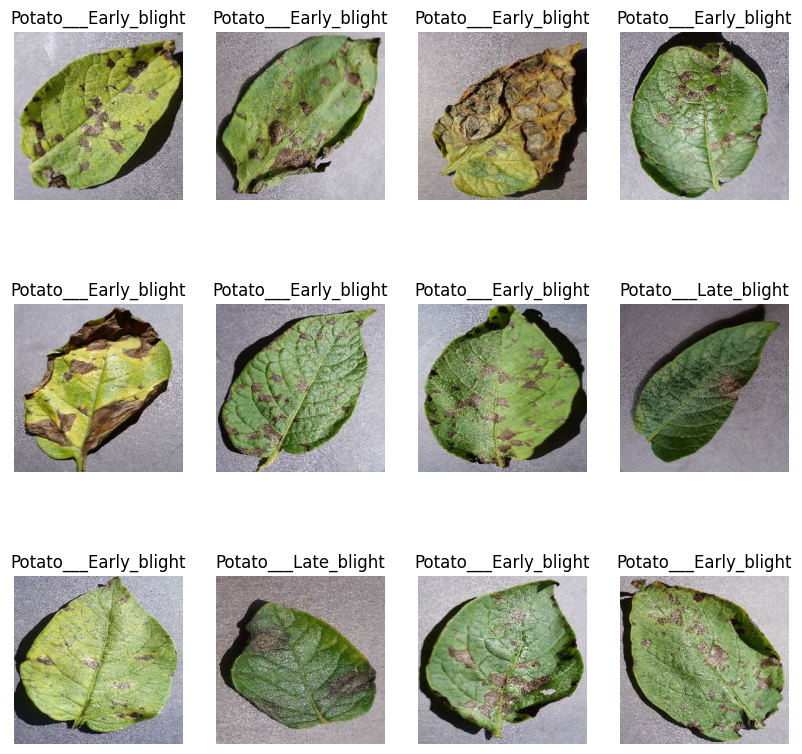

In [7]:
plt.figure(figsize=(10,10))
for image_batch, label_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[label_batch[i]])
        plt.axis("off")

In [8]:
for image_batch, labels_batch in dataset.take(1): # give us value of one batch
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 256, 256, 3)
[0 0 0 0 0 1 0 1 1 0 1 0 0 0 2 1 1 1 1 0 0 1 1 0 1 1 1 0 1 0 1 2]


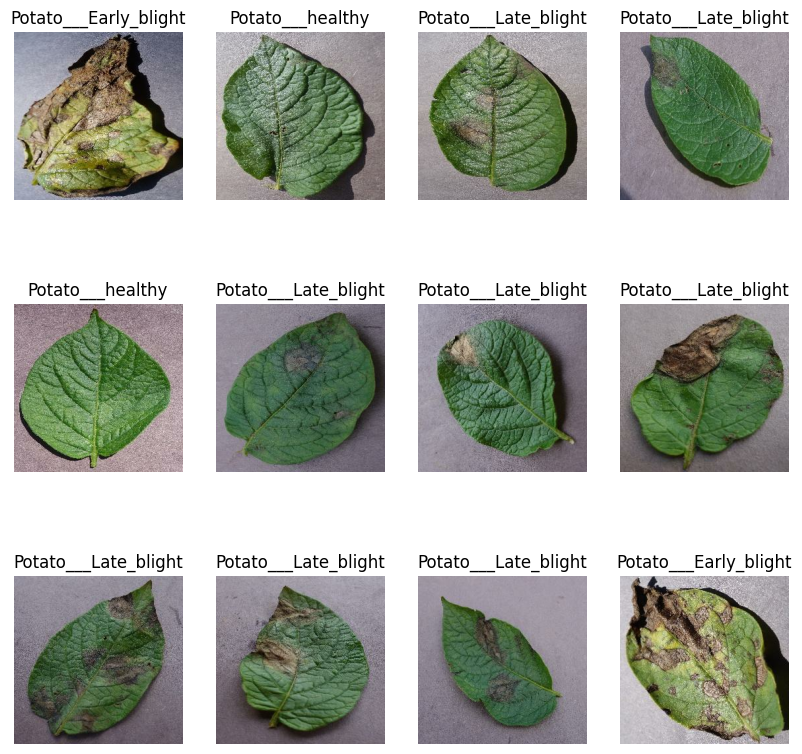

In [9]:
# Visualize some of the images from our dataset
plt.figure(figsize=(10, 10))
for image_batch, labels_batch in dataset.take(1): # give us value of one batch
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

.............................................................................................................................................................................

### Function to Split Dataset --->

##### Dataset should be bifurcated into 3 subsets namely:

1. Training: Dataset to be used while training
2. Validation: Dataset to be tested against while training
3. Test: Dataset to be tested against after we trained a model

===============================================================

**80 %** ==> training
**20 %** ==> **10%**(validation) + **10%** (test)

In [10]:
len(dataset)

68

In [11]:
train_size = 0.8
len(dataset)*train_size

54.400000000000006

In [12]:
train_ds = dataset.take(54)
len(train_ds)

54

In [13]:
test_ds = dataset.skip(54)
len(test_ds)

14

**TEST DATA(14) = VALIDATION(6) + TESTING(8)**

In [27]:
# Validation Dataset
val_size=0.1
len(dataset)*val_size

6.800000000000001

In [28]:
val_ds = test_ds.take(6)
len(val_ds)

6

In [29]:
test_ds = test_ds.skip(6)
len(test_ds)

2

In [30]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size) #0.8 * total no. of data
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [31]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [32]:
len(train_ds)

54

In [33]:
len(val_ds)

6

In [34]:
len(test_ds)

8

#### Caache, Shuffle, and Prefetch the Dataset

In [35]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

### **Building The Model**

-------------------------

#### Creating a Layer for Resizing and Normalization

Before we feed our images to network, we should be resizing it to the desired size. Moreover, to improve model performance, we should normalize the image pixel value (keeping them in range 0 and 1 by dividing by 256). This should happen while training as well as inference. Hence we can add that as a layer in our Sequential Model.

You might be thinking why do we need to resize (256,256) image to again (256,256). You are right we don't need to but this will be useful when we are done with the training and start using the model for predictions. At that time somone can supply an image that is not (256,256) and this layer will resize it

In [94]:
resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE, IMAGE_SIZE, input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS)),
    layers.Rescaling(1./255)
], name="resize_and_rescale")


##### Data Augmentation :

 is needed when we have less data, this boosts the accuracy of our model by augmenting the data.

In [95]:
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.2)
    # 0.2 * 360 = 72 degrees.
])

##### Applying Data Augmentation to Train Dataset

In [96]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)

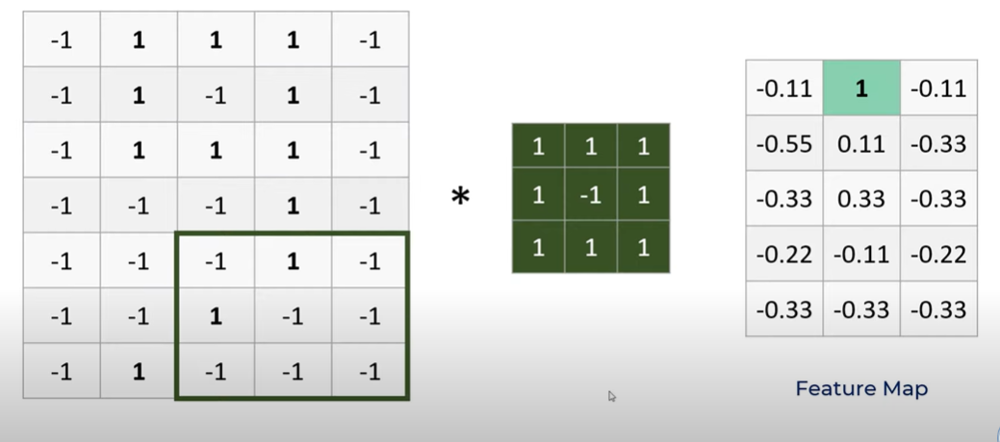

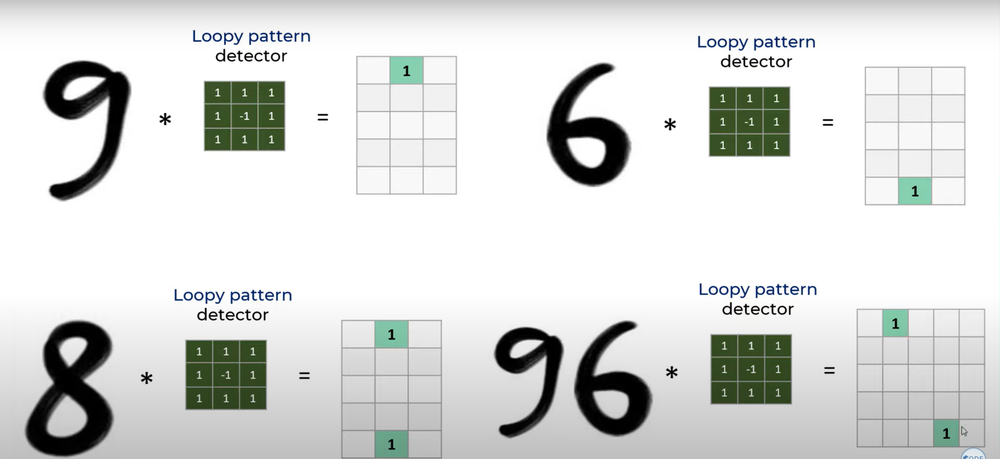

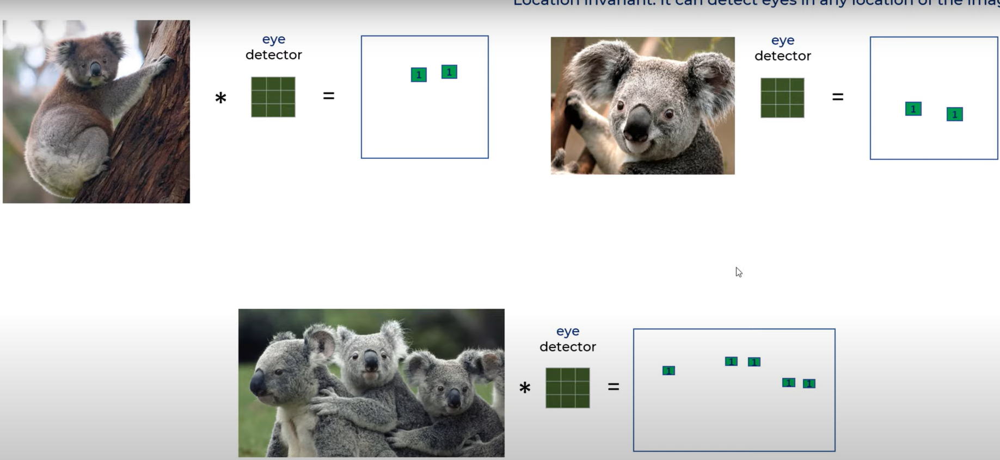

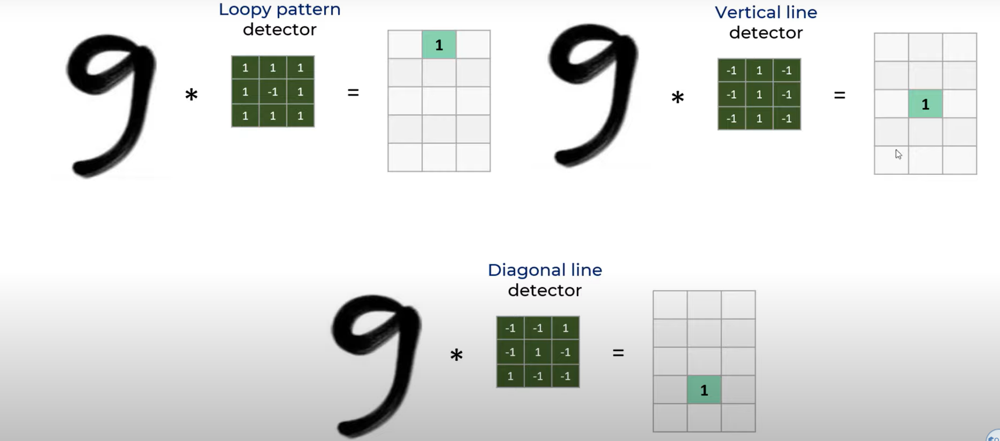

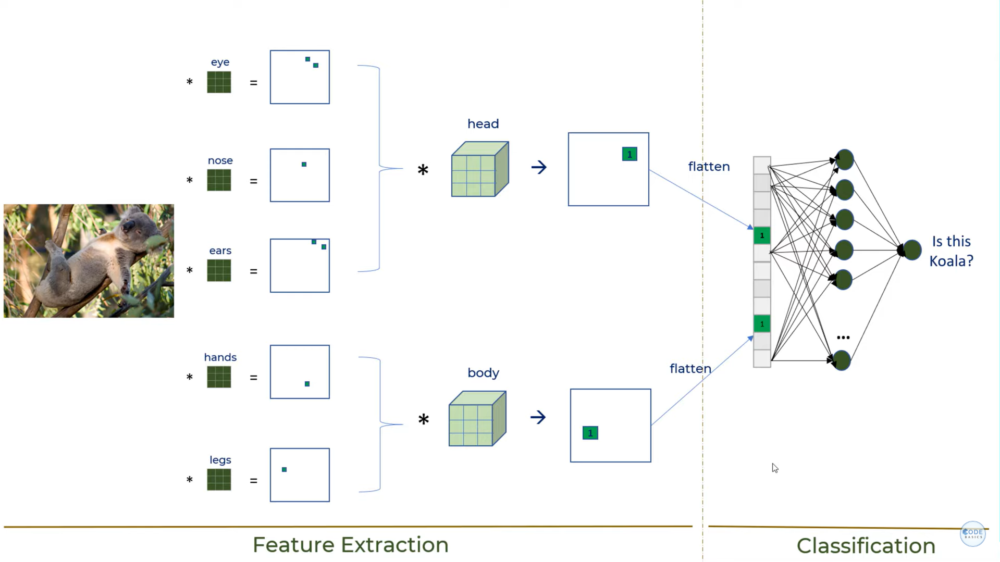
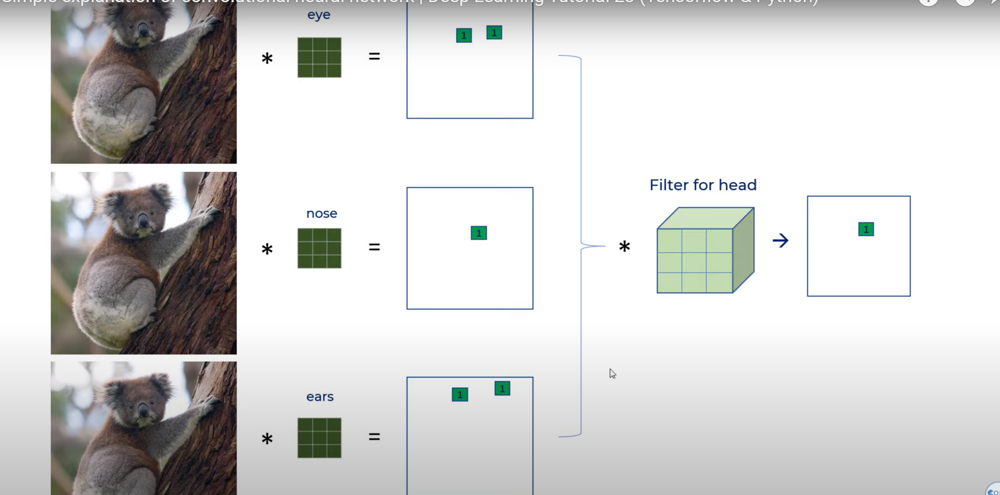

1 indicates loopy pattern

#### **Pooling layers is used to reduce size of img**

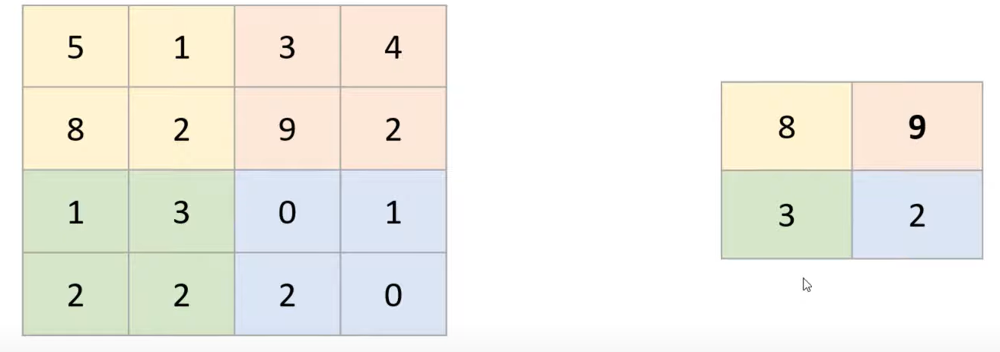

**2 by 2 fliter with stride =2**

stride =2 means move 2 steps

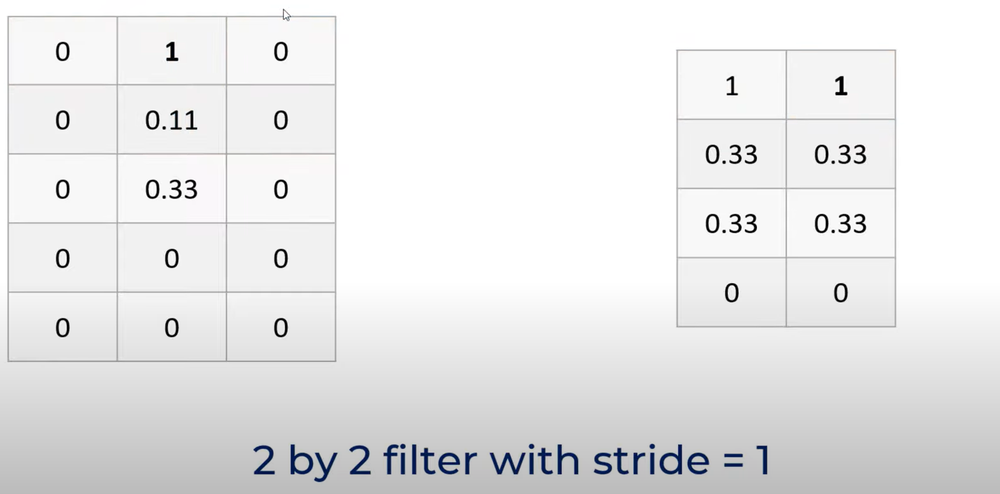

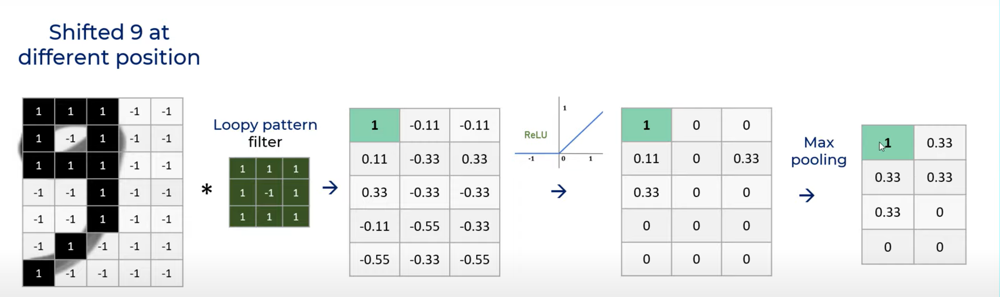

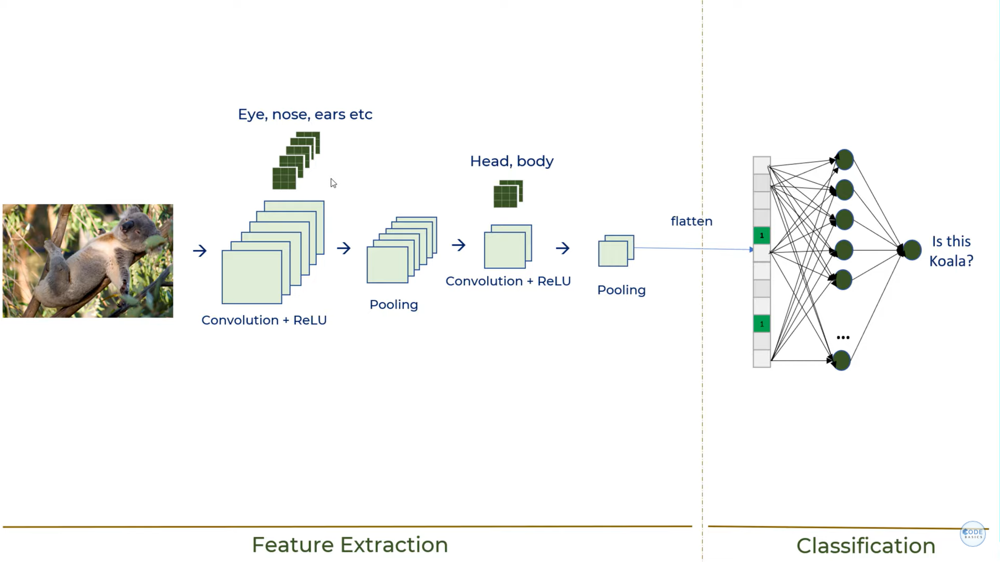
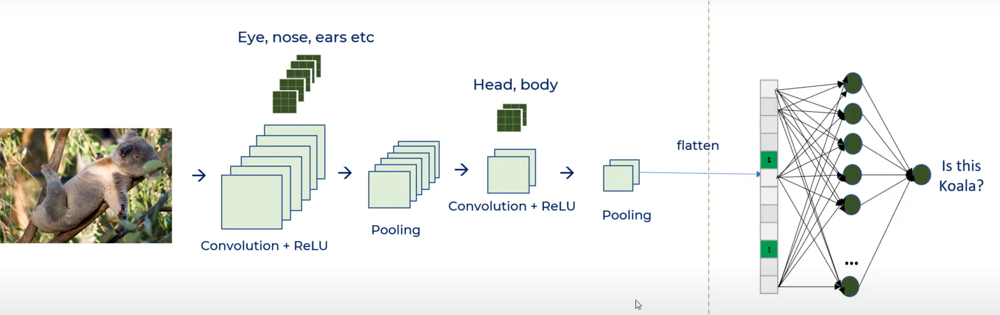

### **Model Architecture**

We use a CNN coupled with a Softmax activation in the output layer  . We also add the initial layers for resizing, normalization and Data Augmentation.

---------------------

In [98]:
input_shape = (IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3

model = models.Sequential([
    resize_and_rescale, 
    # a variable created above with name resize_and_rescale
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    # 32 layers,kernel size is filter(3*3), input shape = defined above
    layers.MaxPooling2D((2, 2)), 
    # max pooling of 2*2 is created
    
    # all these 32,64 numbers are based on trial and error
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Flatten(),
    layers.Dense(64, activation='relu'),# dense layer of 64 neuron
    layers.Dense(n_classes, activation='softmax'),
])

In [107]:
# model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [108]:
model.summary()

Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resize_and_rescale (Sequential) │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_168 (Conv2D)             │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_168               │ (None, 127, 127, 32)   │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_169 (Conv2D)             │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_169               │ (None, 62, 62, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_170 (Conv2D)             │ (None, 60, 60, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_170               │ (None, 30, 30, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_171 (Conv2D)             │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_171               │ (None, 14, 14, 64)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_172 (Conv2D)             │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_172               │ (None, 6, 6, 64)       │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_173 (Conv2D)             │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_173               │ (None, 2, 2, 64)       │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_28 (Flatten)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_56 (Dense)                │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 183,747 (717.76 KB)

 Trainable params: 183,747 (717.76 KB)

 Non-trainable params: 0 (0.00 B)

Verbose: Controls the amount of detail in the training output/log.
Epochs: The number of times the entire training dataset is passed through the model during training.

### **Compiling Model**

We use **adam** Optimizer, **SparseCategoricalCrossentropy** for losses, **accuracy** as a metric

In [109]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [110]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - accuracy: 0.4921 - loss: 0.9003 - val_accuracy: 0.7396 - val_loss: 0.5716
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.7091 - loss: 0.5938 - val_accuracy: 0.6927 - val_loss: 0.6248
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - accuracy: 0.8301 - loss: 0.3856 - val_accuracy: 0.8177 - val_loss: 0.7696
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - accuracy: 0.8569 - loss: 0.3341 - val_accuracy: 0.8542 - val_loss: 0.4294
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.8831 - loss: 0.2760 - val_accuracy: 0.8906 - val_loss: 0.4370
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.8913 - loss: 0.2616 - val_accuracy: 0.9062 - val_loss: 0.3703
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - accuracy: 0.9105 - loss: 0.2095 - val_accuracy: 0.9010 - val_loss: 0.2574
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.9219 - loss: 0.2116 - val_accuracy: 0.9115 - val_loss:

In [112]:
scores = model.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 199ms/step - accuracy: 0.9367 - loss: 0.3025


In [113]:
scores

[0.2275562286376953, 0.9453125]

Scores is just a list containing loss and accuracy value

### **Plotting the Accuracy and Loss Curves**

In [114]:
history

In [115]:
history.params

{'verbose': 1, 'epochs': 50, 'steps': 54}

In [116]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [117]:
type(history.history['loss'])

list

In [118]:
len(history.history['loss'])

50

In [119]:
history.history['loss'][:5] # show loss for first 5 epochs

[0.8554654121398926,
 0.5608930587768555,
 0.3592495024204254,
 0.3066449761390686,
 0.2578292489051819]

In [120]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

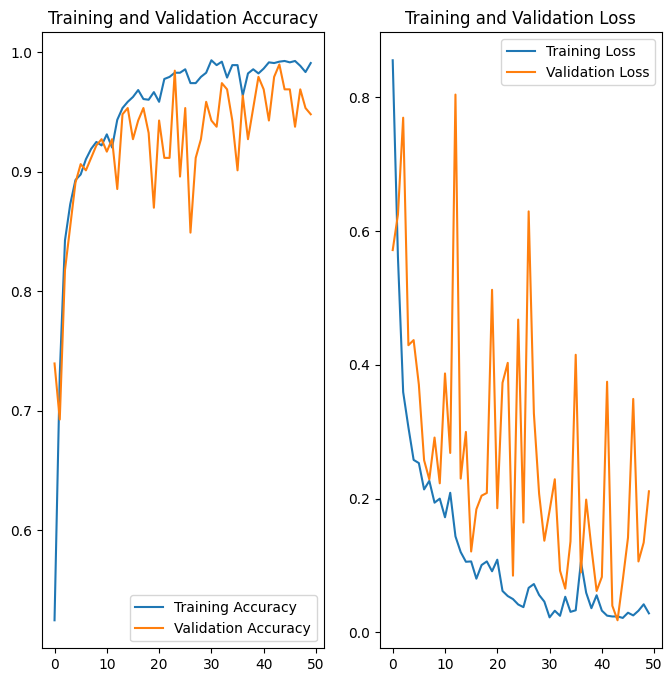

In [121]:
EPOCHS = len(acc)
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

#### **Run prediction on a sample image**

first image to predict
actual label: Potato___Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
predicted label: Potato___Late_blight


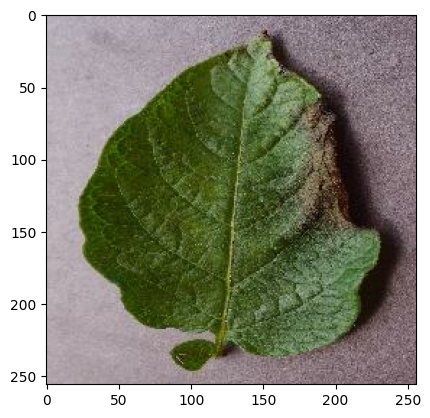

In [122]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

#### **Write a function for inference**

In [123]:
from tensorflow.keras.preprocessing.image import img_to_array
def predict(model, img):
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, 0)  # Create a batch 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

**Now run inference on few sample images**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


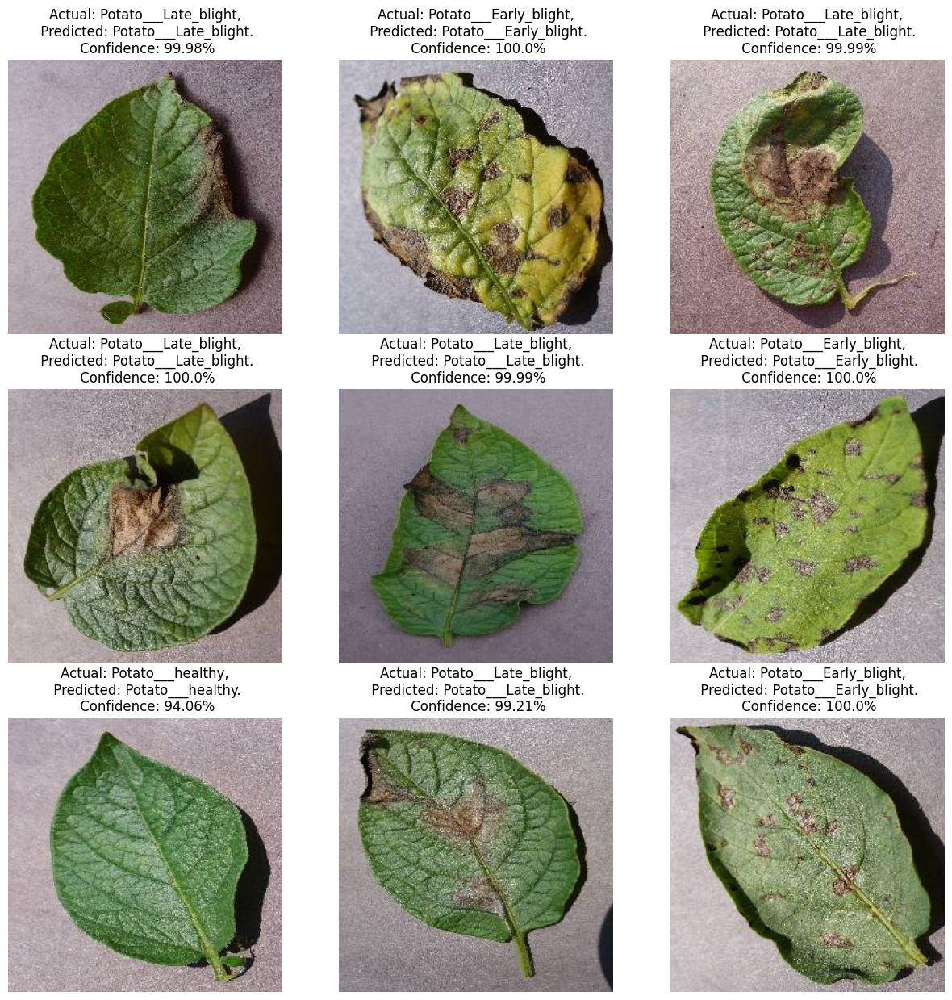

In [124]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

## **Saving the Model**

We append the model to the list of models as a new version

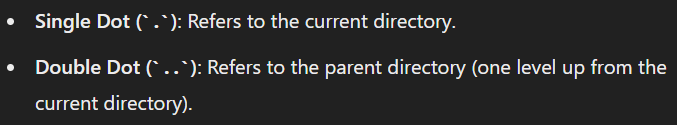

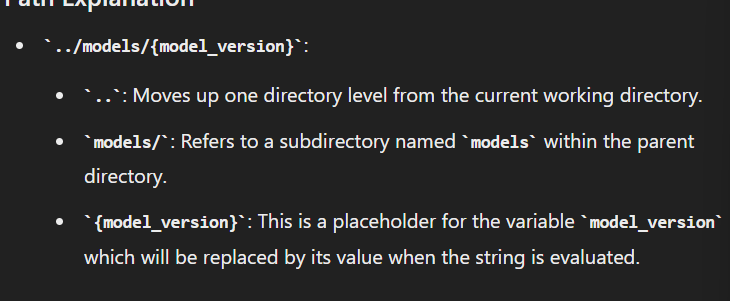

In [126]:
import os

# Find the next model version
model_version = max(
    [int(i) for i in os.listdir("../saved_models") if i.isdigit()] + [0]
) + 1

# Export the model
model.export(f"../saved_models/{model_version}")

INFO:tensorflow:Assets written to: ../saved_models/5\assets


INFO:tensorflow:Assets written to: ../saved_models/5\assets


Saved artifact at '../saved_models/5'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='keras_tensor_137')
Output Type:
  TensorSpec(shape=(None, 3), dtype=tf.float32, name=None)
Captures:
  1747327168400: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1747327168976: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1747327168592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1747327169744: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1747327169360: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1747327170128: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1747327169936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1747327170512: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1747327170320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1747327170896: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1747327170704: TensorSpec(sha

**Assets** --> stores arbritary files,called assets, that are needed for tensorflow graph 

**Variables** -->which stores wight

**saved_model.pb** --> whicch stores the model architecture, and training  configuration(including the optimizer , looses, and metrics)

In [127]:
model.save("../potatoes.h5")